# Here two vector databases are created

One using the fine tuned BERT with cls pooling

One using the pretrained BERT with cls pooling

In [30]:
# Imports

from lxml import etree

from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain.docstore.document import Document

from sentence_transformers import SentenceTransformer, models
from langchain_huggingface import HuggingFaceEmbeddings
from langchain.vectorstores import Annoy, FAISS
from typing import List
from langchain.vectorstores.base import VectorStore


import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

from langchain.llms import GPT4All
from langchain.chains import RetrievalQA

# Namespace Spec (for lxml)
NS = {'uslm': 'http://xml.house.gov/schemas/uslm/1.0',
      'xhtml': 'http://www.w3.org/1999/xhtml'}

Parse tax law

In [3]:
def get_ancestor_heading_text(section, tag, ns):
    ancestor = section.getparent()
    while ancestor is not None:
        if ancestor.tag == f"{{{ns['uslm']}}}{tag}":
            heading = ancestor.find('uslm:heading', namespaces=ns)
            return heading.text.strip() if heading is not None else ""
        ancestor = ancestor.getparent()
    return ""

def parse_sections_with_metadata(file_path):
    with open(file_path, 'rb') as f:
        tree = etree.parse(f)
    
    sections = tree.findall('.//uslm:section', namespaces=NS)
    parsed = []

    for section in sections:
        heading = section.find('uslm:heading', namespaces=NS)
        heading_text = heading.text.strip() if heading is not None else ""

        # Get all paragraphs (and any nested elements)
        content_texts = []
        for p in section.findall('.//uslm:p', namespaces=NS):
            text = ' '.join(p.itertext()).strip()
            if text:
                content_texts.append(text)

        if len(content_texts) == 0:
            continue

        # Get ancestors: subtitle, chapter, part
        subtitle = get_ancestor_heading_text(section, 'subtitle', NS)
        chapter = get_ancestor_heading_text(section, 'chapter', NS)
        part = get_ancestor_heading_text(section, 'part', NS)

        parsed.append({
            "metadata": {
                "subtitle": subtitle,
                "chapter": chapter,
                "part": part
                },
            "content": "\n".join(content_texts)
        })

    return parsed

data_dict = parse_sections_with_metadata("/DL-data/usc26.xml")
data_dict

[{'metadata': {'subtitle': 'Income Taxes',
   'chapter': 'NORMAL TAXES AND SURTAXES',
   'part': 'TAX ON INDIVIDUALS'},
  'content': 'There is hereby imposed on the taxable income of every head of a household (as defined in section 2(b)) a tax determined in accordance with the following table: \n \n \n \n \n \n \n If taxable income is: The tax is: \n \n \n Not over $29,600 15% of taxable income. \n Over $29,600 but not over $76,400 $4,440, plus 28% of the excess over $29,600. \n Over $76,400 but not over $127,500 $17,544, plus 31% of the excess over $76,400. \n Over $127,500 but not over $250,000 $33,385, plus 36% of the excess over $127,500. \n Over $250,000 $77,485, plus 39.6% of the excess over $250,000.\nThere is hereby imposed on the taxable income of every individual (other than a surviving spouse as defined in section 2(a) or the head of a household as defined in section 2(b)) who is not a married individual (as defined in section 7703) a tax determined in accordance with the fo

Ingest & chunk data

In [4]:
# Wrap in LangChain Document objects
documents = [
    Document(page_content=d["content"], metadata=d["metadata"])
    for d in data_dict
]

# Split each document into smaller chunks
text_splitter = RecursiveCharacterTextSplitter(chunk_size=512, chunk_overlap=64)
chunked_docs = text_splitter.split_documents(documents)

Embed and Store 

In [5]:
# Init the embedding model -- fine tuned 
ft_embedding_model = HuggingFaceEmbeddings(model_name="chandlerNick/sentence-transformers-usc26-bert")

# BERT BASE
bert = models.Transformer('bert-base-uncased')

pooling = models.Pooling(
    word_embedding_dimension=bert.get_word_embedding_dimension(),
    pooling_mode_cls_token=True,
    pooling_mode_mean_tokens=False,
    pooling_mode_max_tokens=False,
)

cls_model = SentenceTransformer(modules=[bert, pooling])
cls_model.save("custom-bert-cls")

pt_embedding_model = HuggingFaceEmbeddings(model_name="./custom-bert-cls")

FT Vector Store

In [ ]:
# Create Annoy vector store from chunked docs
ft_vector_store = Annoy.from_documents(chunked_docs, ft_embedding_model)
ft_vector_store.save_local("ft_annoy_tax_code_index")

In [11]:
# Create FAISS vector store
ft_vector_store_2 = FAISS.from_documents(chunked_docs, ft_embedding_model)
ft_vector_store_2.save_local("faiss_ft_store")

PT Vector Store

In [ ]:
# Create Annoy vector store from chunked docs
pt_vector_store = Annoy.from_documents(chunked_docs, pt_embedding_model)
pt_vector_store.save_local("pt_annoy_tax_code_index")

In [12]:
# Create FAISS vector store
pt_vector_store_2 = FAISS.from_documents(chunked_docs, pt_embedding_model)
pt_vector_store_2.save_local("faiss_pt_store")

Qualitative Comparison of Vector Stores

In [31]:
def inspect_query_results(
    query: str,
    vector_stores: List[VectorStore],
    labels: List[str],
    k: int = 5,
    metadata_key: str = "subtitle",
    print_content_preview_chars: int = 200,
):
    """
    Inspect the top-k results of a query across multiple vector stores.

    Args:
        query (str): The input query string.
        vector_stores (List[VectorStore]): List of LangChain vector store objects.
        labels (List[str]): List of string labels for each vector store (e.g. "FT BERT + Annoy").
        k (int): Number of top documents to retrieve per vector store.
        metadata_key (str): Key in metadata to show (e.g., "subtitle").
        print_content_preview_chars (int): Number of characters from page content to preview.

    Returns:
        None
    """
    print(f"\n🔍 Query: \"{query}\"")
    print("-" * 80)

    for store, label in zip(vector_stores, labels):
        print(f"\n📘 {label}")
        print("=" * len(label))
        try:
            results = store.similarity_search(query, k=k)
        except:
            results = store.similarity_search_with_score(query, k=k)
            results = [res[0] for res in results]  # Strip scores if needed

        for idx, doc in enumerate(results):
            subtitle = doc.metadata.get(metadata_key, "Unknown")
            content_preview = doc.page_content[:print_content_preview_chars].replace("\n", " ")
            print(f"{idx+1}. [{subtitle}] {content_preview}...")

        print("-" * 80)

In [34]:
vector_stores = [ft_vector_store, pt_vector_store, ft_vector_store_2, pt_vector_store_2]
labels = [
    "FT BERT + Annoy",
    "CLS BERT + Annoy",
    "FT BERT + FAISS",
    "CLS BERT + FAISS"
]
queries = [
    "A tax is hereby imposed for each taxable year on the taxable income of every corporation",  # Directly copied text from document
    "For purposes of this part, an individual shall be treated as not married at the close of the taxable year if such individual is so treated under the provisions of section 7703(b)",  # Direct quoting
    "Tax on head of household",  # Near text from the documents
    "Tree huggers are cool!"  # A garbage query, unrelated to the tax law
]

for query in queries:
    inspect_query_results(
        query=query,
        vector_stores=vector_stores,
        labels=labels,
        k=5,
        metadata_key="subtitle"
    )



🔍 Query: "A tax is hereby imposed for each taxable year on the taxable income of every corporation"
--------------------------------------------------------------------------------

📘 FT BERT + Annoy
1. [Income Taxes] Subsec. (a)(5).  Pub. L. 92–603, § 135(a)(1)(B) , struck out par. (5) which provided that in the case of taxable years beginning after  Dec. 31, 2010 , the tax shall be equal to 7.0 percent of the amo...
2. [Income Taxes] In the case of a nonresident alien individual present in the United States for a period or periods aggregating 183 days or more during the taxable year, there is hereby imposed for such year a tax of ...
3. [Income Taxes] the United States as the amount upon which the existing 30 percent levy should be imposed, and added contingent income received from the sale of patents and other intangibles and amounts of original i...
4. [Income Taxes] “(B)   Computation of tax .— If subparagraph (A) applies to any lump sum distribution of any taxpayer for any taxab

Comparison of Embedding Models' Embedding Spaces (Low dimensional projection)

In [ ]:

def plot_two_faiss_embeddings_pca_side_by_side(
    vector_store1: FAISS,
    vector_store2: FAISS,
    color_key="subtitle",
    title1="Vector Store 1",
    title2="Vector Store 2",
    figsize=(16, 7),
):
    """
    Plot PCA projections of embeddings from two LangChain FAISS vector stores side by side.

    Args:
        vector_store1 (FAISS): First FAISS vector store.
        vector_store2 (FAISS): Second FAISS vector store.
        color_key (str): Metadata key to color points by. Default is "subtitle".
        title1 (str): Title for the first subplot.
        title2 (str): Title for the second subplot.
        figsize (tuple): Figure size.

    Returns:
        fig (matplotlib.figure.Figure): The matplotlib figure object.
        axs (np.ndarray): Array of the two subplot axes.
    """
    def extract_embeddings_and_labels(vector_store):
        faiss_index = vector_store.index
        num_vectors = faiss_index.ntotal
        dim = faiss_index.d
        embeddings = np.zeros((num_vectors, dim), dtype="float32")
        faiss_index.reconstruct_n(0, num_vectors, embeddings)
        metadatas = [doc.metadata for doc in vector_store.docstore._dict.values()]
        labels = [meta.get(color_key, "Unknown") for meta in metadatas]
        return embeddings, labels

    embeddings1, labels1 = extract_embeddings_and_labels(vector_store1)
    embeddings2, labels2 = extract_embeddings_and_labels(vector_store2)

    # Combine unique labels from both sets for consistent coloring
    unique_labels = sorted(set(labels1) | set(labels2))
    label_to_idx = {label: idx for idx, label in enumerate(unique_labels)}

    color_indices1 = [label_to_idx[label] for label in labels1]
    color_indices2 = [label_to_idx[label] for label in labels2]

    pca = PCA(n_components=2)
    # Fit PCA on combined data for consistent axes
    combined_embeddings = np.vstack([embeddings1, embeddings2])
    combined_projected = pca.fit_transform(combined_embeddings)

    projected1 = combined_projected[:len(embeddings1)]
    projected2 = combined_projected[len(embeddings1):]

    fig, axs = plt.subplots(1, 2, figsize=figsize)

    scatter1 = axs[0].scatter(projected1[:, 0], projected1[:, 1], c=color_indices1, cmap="tab10", alpha=0.7, s=5)
    scatter2 = axs[1].scatter(projected2[:, 0], projected2[:, 1], c=color_indices2, cmap="tab10", alpha=0.7, s=5)

    # Legend (one common legend on the right)
    handles, labels = scatter1.legend_elements()
    fig.legend(handles, unique_labels, title=color_key, loc='center right')

    axs[0].set_title(title1)
    axs[1].set_title(title2)

    var_pc1 = pca.explained_variance_ratio_[0] * 100
    var_pc2 = pca.explained_variance_ratio_[1] * 100

    for ax in axs:
        ax.set_xlabel(f"PC1 ({var_pc1:.1f}%)")
        ax.set_ylabel(f"PC2 ({var_pc2:.1f}%)")

    plt.tight_layout(rect=[0, 0, 0.75, 1])  # Leave room for legend on right

    return fig, axs


PCA

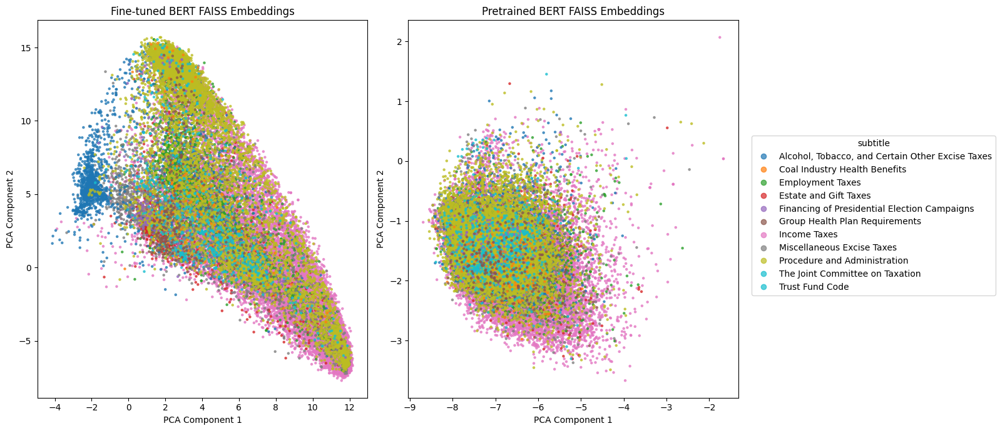

In [24]:
fig, axs = plot_two_faiss_embeddings_pca_side_by_side(
    ft_vector_store_2,
    pt_vector_store_2,
    color_key="subtitle",
    title1="Fine-tuned BERT FAISS Embeddings",
    title2="Pretrained BERT FAISS Embeddings"
)
plt.show()


### Analysis of PC1-PC2 Embedding Space

One can see clearer grouping by subtitle in the Fine Tuned BERT's embedding space. This is presumably due to the similarity in the embedded representation induced by the document classification fine tuning task. It is worth noting that large amounts of information are lost in this visualization due to the projection from 768 dimensions to 2.